# Imports

In [1]:
import os
import cv2
import time
import shutil
import numpy as np
from PIL import Image
from PIL import Image as PilImage
from matplotlib import pyplot as plt

import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# Hair Segmentation & Hair Color Change (OpenCV)

In [2]:
def HairSegmenter(img, dilate):
    model_path = '/home/vuong.nguyen/vuong/augmentare/Bias Celeba/hair_segmenter.tflite'
    base_options = python.BaseOptions(model_asset_path=model_path)

    BaseOptions = mp.tasks.BaseOptions
    ImageSegmenter = mp.tasks.vision.ImageSegmenter
    ImageSegmenterOptions = mp.tasks.vision.ImageSegmenterOptions
    VisionRunningMode = mp.tasks.vision.RunningMode

    # Create a image segmenter instance with the image mode:
    options = ImageSegmenterOptions(
        base_options=BaseOptions(model_asset_path=model_path),
        running_mode=VisionRunningMode.IMAGE,
        output_category_mask=True)

    BG_COLOR = (0, 0, 0) # gray
    MASK_COLOR = (255, 255, 255) # white

    with ImageSegmenter.create_from_options(options) as segmenter:
        # Perform image segmentation on the provided single image.
        # The image segmenter must be created with the image mode.
        segmented_masks = segmenter.segment(img)
        category_mask = segmented_masks.category_mask

        # Generate solid color images for showing the output segmentation mask.
        image_data = img.numpy_view()
        fg_image = np.zeros(image_data.shape, dtype=np.uint8)
        fg_image[:] = MASK_COLOR
        bg_image = np.zeros(image_data.shape, dtype=np.uint8)
        bg_image[:] = BG_COLOR

        condition = np.stack((category_mask.numpy_view(),) * 3, axis=-1) > 0.2
        output_image = np.where(condition, fg_image, bg_image)
        mask = cv2.inRange(output_image, MASK_COLOR, MASK_COLOR)
        mask = np.clip(mask, 0, 1)

        kernel = np.ones((dilate, dilate), np.uint8)
        dilated_mask = cv2.dilate(mask, kernel)
    return mask, dilated_mask

In [3]:
def plot_hair_color_levels(source_path, images_list, color_filter):
    nb_images = len(images_list)
    col_1 = ['Original Image', 'Mask']
    alphas = np.linspace(.3, .95, 7)
    col_2 = ['Alpha = {}'.format(round(alpha,3)) for alpha in alphas]
    cols = col_1 + col_2

    fig, ax = plt.subplots(nrows=nb_images, ncols=len(cols), figsize=(17,9))
    for i in range(nb_images):
        for j in range(len(cols)):
            if j == 0:
                img = cv2.imread(f"{source_path}/{images_list[i]}")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax[i,j].axis('off')
                ax[i,j].imshow(img)

            elif j ==1:
                image = mp.Image.create_from_file(f"{source_path}/{images_list[i]}")
                img, _ = HairSegmenter(image, 5)
                img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
                img = (img * 255).astype(np.uint8)
                ax[i,j].axis('off')
                ax[i,j].imshow(img)

            else:
                face = cv2.imread(f"{source_path}/{images_list[i]}")
                image = mp.Image.create_from_file(f"{source_path}/{images_list[i]}")
                mask, _ = HairSegmenter(image, 5)
                mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
                mask = (mask * 255).astype(np.uint8)
                _, mask = cv2.threshold(mask, thresh=180, maxval=255, type=cv2.THRESH_BINARY)

                hair_color = np.copy(face)
                # boolean indexing and assignment based on mask
                hair_color[(mask==255).all(-1)] = color_filter
                hair_color_w = cv2.addWeighted(hair_color, 1-alphas[j-2], face, alphas[j-2], 0)
                ax[i,j].axis('off')
                ax[i,j].imshow(cv2.cvtColor(hair_color_w, cv2.COLOR_BGR2RGB))

    for ax, col in zip(ax[0], cols):
        ax.set_title(col)
        
    fig.tight_layout()
    plt.show()

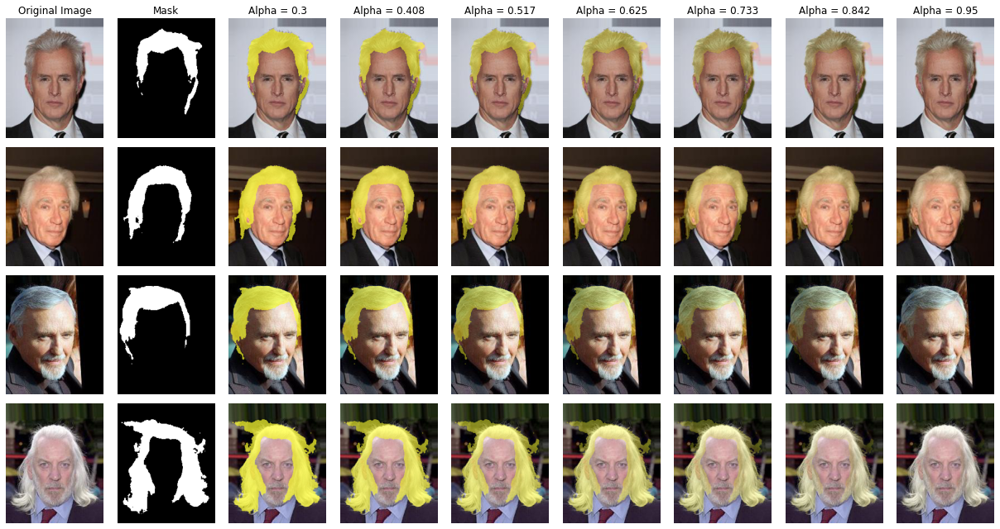

In [5]:
source_path = "/home/vuong.nguyen/vuong/augmentare/joliGEN/dataset/diffusion_hair_color_male/trainA/imgs"
images_list = ["000221.jpg", "001679.jpg", "001711.jpg", "001833.jpg"]
color_filter = [45, 255, 255]
plot_hair_color_levels(source_path, images_list, color_filter)

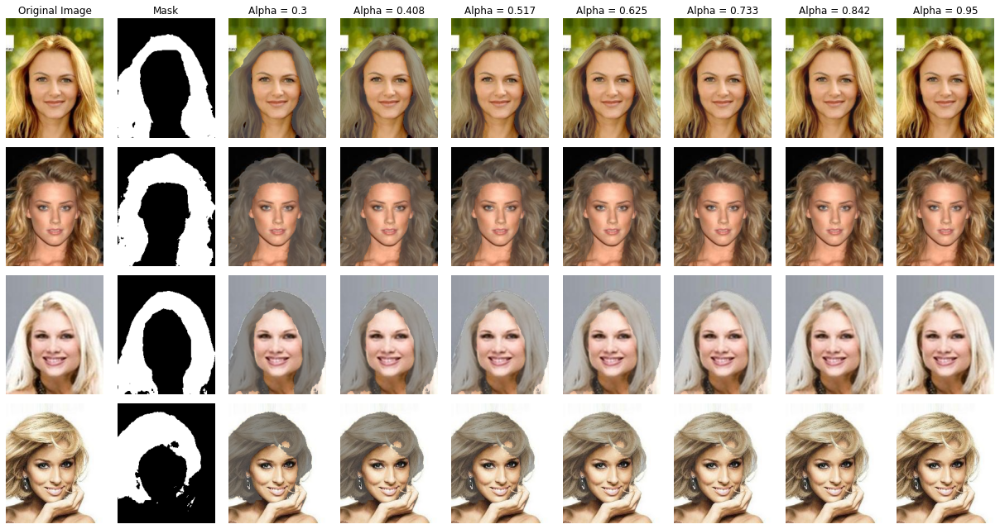

In [5]:
source_path = "/home/vuong.nguyen/vuong/augmentare/joliGEN/dataset/diffusion_female_blond_2_male_blond/trainA/img"
images_list = ["000476.jpg", "000918.jpg", "000943.jpg", "001525.jpg"]
color_filter = [91,91,91]
plot_hair_color_levels(source_path, images_list, color_filter)

# Diffusion Models

In [7]:
def plot_diffusion_images(source_path, nb_images):
    dir_list = sorted(os.listdir(source_path))
    nb_dir = len(dir_list)

    col_1 = ['Original Image', 'Mask']
    col_2 = ['Generated Image {}'.format(nb) for nb in range(1, nb_images+1)]
    cols = col_1 + col_2

    fig, ax = plt.subplots(nrows=nb_dir, ncols=nb_images+2, figsize=(12,12))
    for i in range(nb_dir):
        for j in range(nb_images+2):
            if j == 0:
                img = cv2.imread(f"{source_path}/{dir_list[i]}/img_0_y_0.png")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            elif j ==1:
                img = cv2.imread(f"{source_path}/{dir_list[i]}/img_{j}_mask.png")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            else:
                img = cv2.imread(f"{source_path}/{dir_list[i]}/img_{j-2}_generated.png")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            ax[i,j].axis('off')
            ax[i,j].imshow(img)
            
    for ax, col in zip(ax[0], cols):
        ax.set_title(col)
        
    fig.tight_layout()
    plt.show()

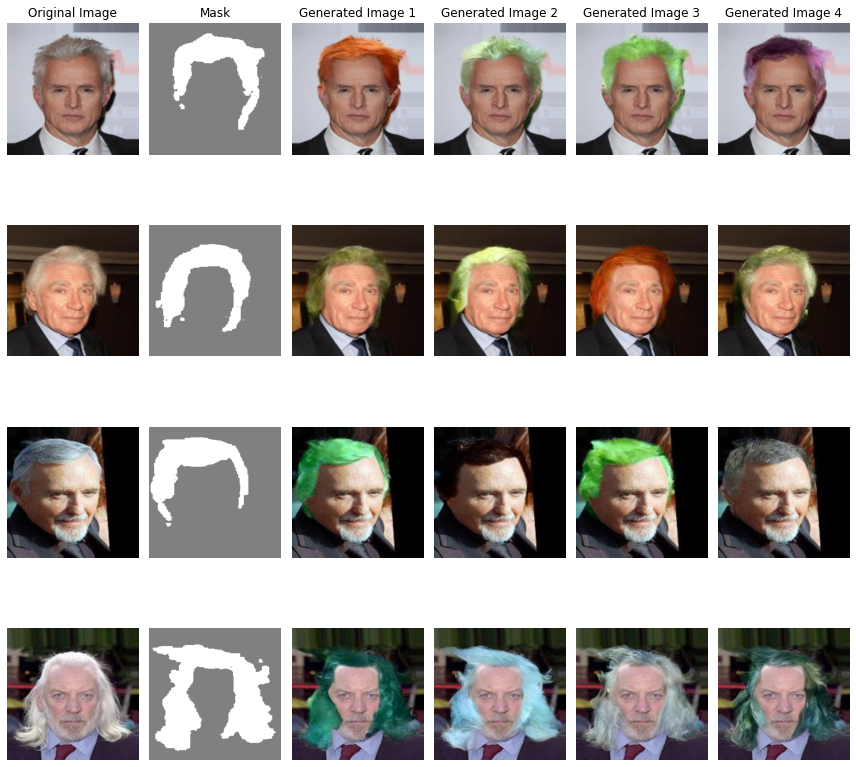

In [8]:
source_path = "/home/vuong.nguyen/vuong/augmentare/joliGEN/inferences/diffusion_hair_color_male"
plot_diffusion_images(source_path, 4)

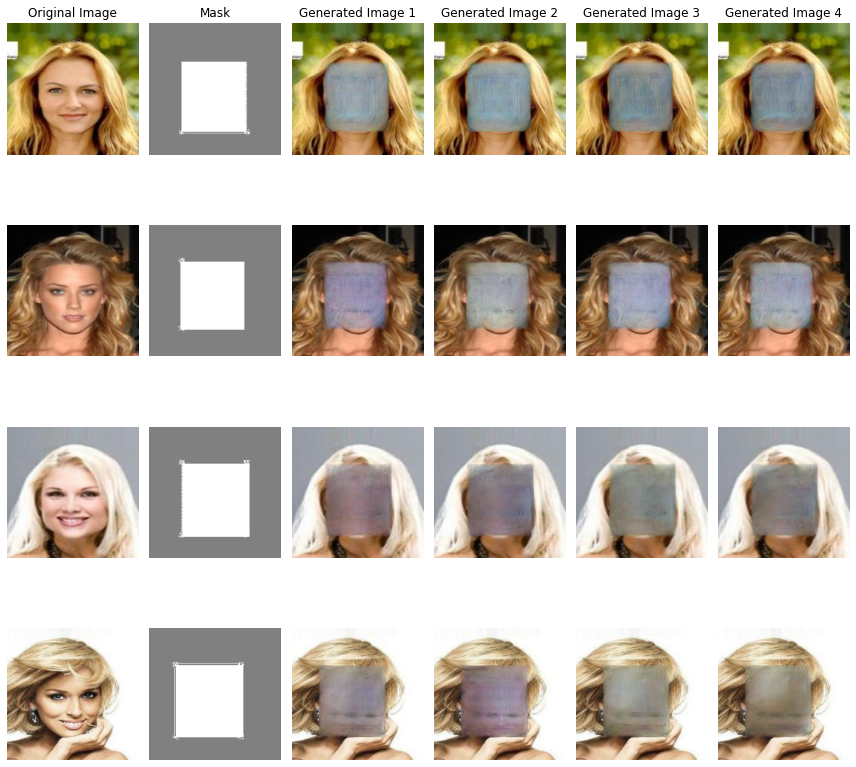

In [9]:
source_path = "/home/vuong.nguyen/vuong/augmentare/joliGEN/inferences/diffusion_female_blond_2_male_blond"
plot_diffusion_images(source_path, 4)

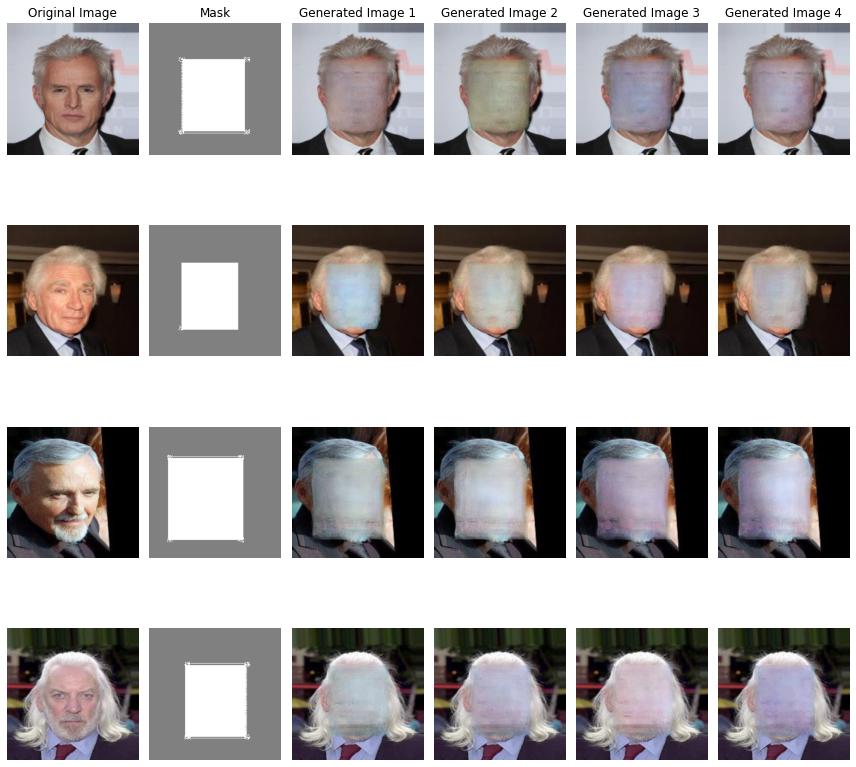

In [10]:
source_path = "/home/vuong.nguyen/vuong/augmentare/joliGEN/inferences/diffusion_male_gray_2_female_gray"
plot_diffusion_images(source_path, 4)

# GANs

In [2]:
def plot_gan_images(source_path, mode):
    cut_path = f"{source_path}/{mode}_cut"
    cut_files_list = sorted(os.listdir(cut_path))
    nb_cut_files = len(cut_files_list)

    cycle_gan_path = f"{source_path}/{mode}_cycle_gan"
    cycle_gan_files_list = sorted(os.listdir(cycle_gan_path))
    
    augmentare_path = f"{source_path}/{mode}_augmentare"
    augmentare_files_list = sorted(os.listdir(augmentare_path))

    cols = ['Original Image', 'CUT', 'Cycle Gan', 'Augmentare']

    fig, ax = plt.subplots(nrows=nb_cut_files, ncols=4, figsize=(12,12))
    for i in range(nb_cut_files):
        for j in range(4):
            if j == 0:
                file = cut_files_list[i].split("_")[1]
                img = cv2.imread(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/dataset/img_align_celeba/{file}")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            elif j ==1:
                img = cv2.imread(f"{cut_path}/{cut_files_list[i]}")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            elif j ==2:
                img = cv2.imread(f"{cycle_gan_path}/{cycle_gan_files_list[i]}")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            else:
                img = cv2.imread(f"{augmentare_path}/{augmentare_files_list[i]}")
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            ax[i,j].axis('off')
            ax[i,j].imshow(img)
            
    for ax, col in zip(ax[0], cols):
        ax.set_title(col)
        
    fig.tight_layout()
    plt.show()

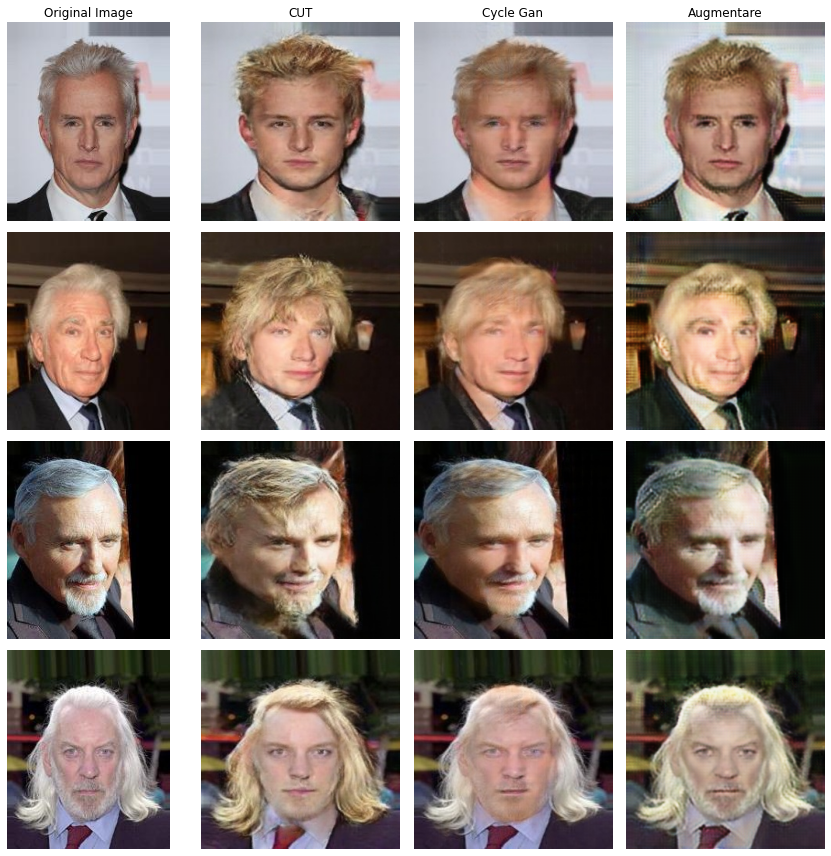

In [23]:
source_path = "/home/vuong.nguyen/vuong/augmentare/joliGEN/inferences"
mode = "male_gray2blond"
plot_gan_images(source_path, mode)

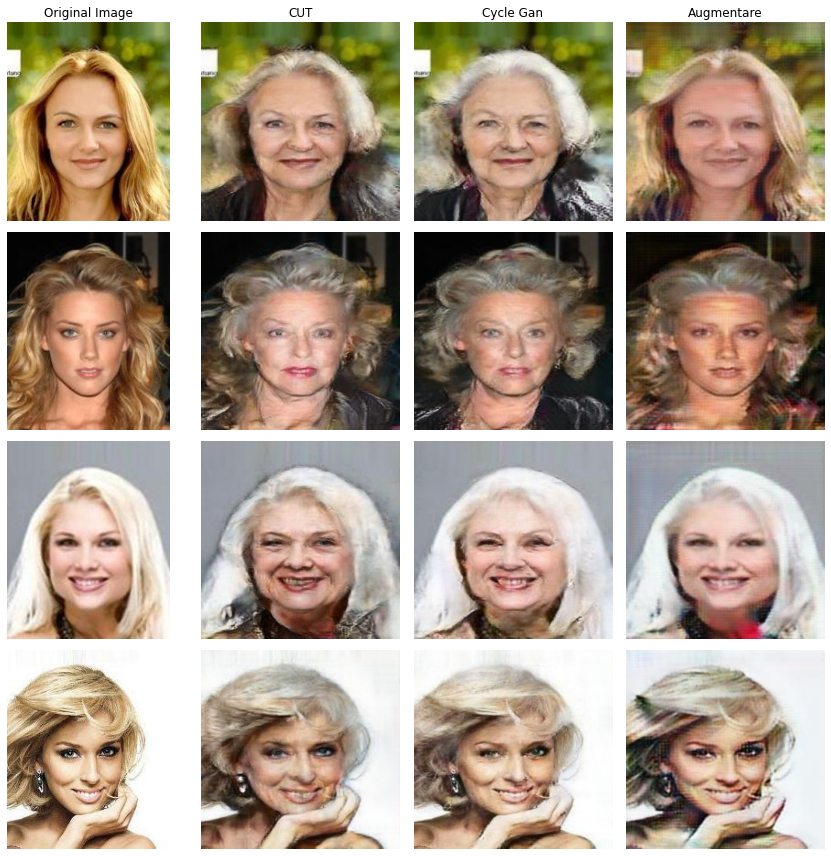

In [24]:
mode = "female_blond2gray"
plot_gan_images(source_path, mode)

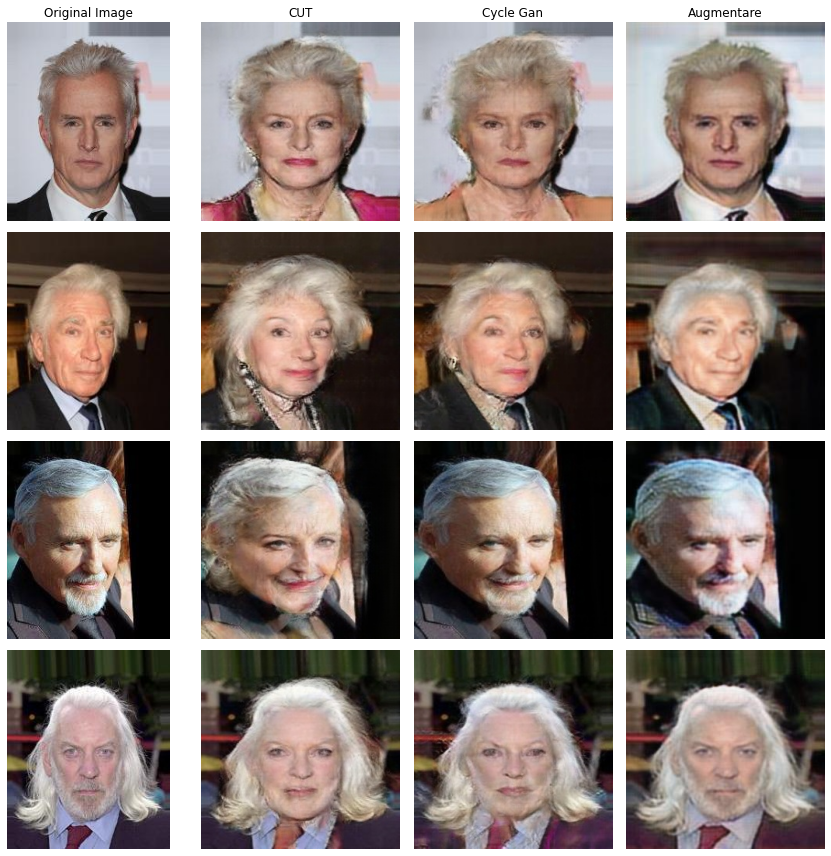

In [26]:
mode = "male_gray_2_female_gray"
plot_gan_images(source_path, mode)

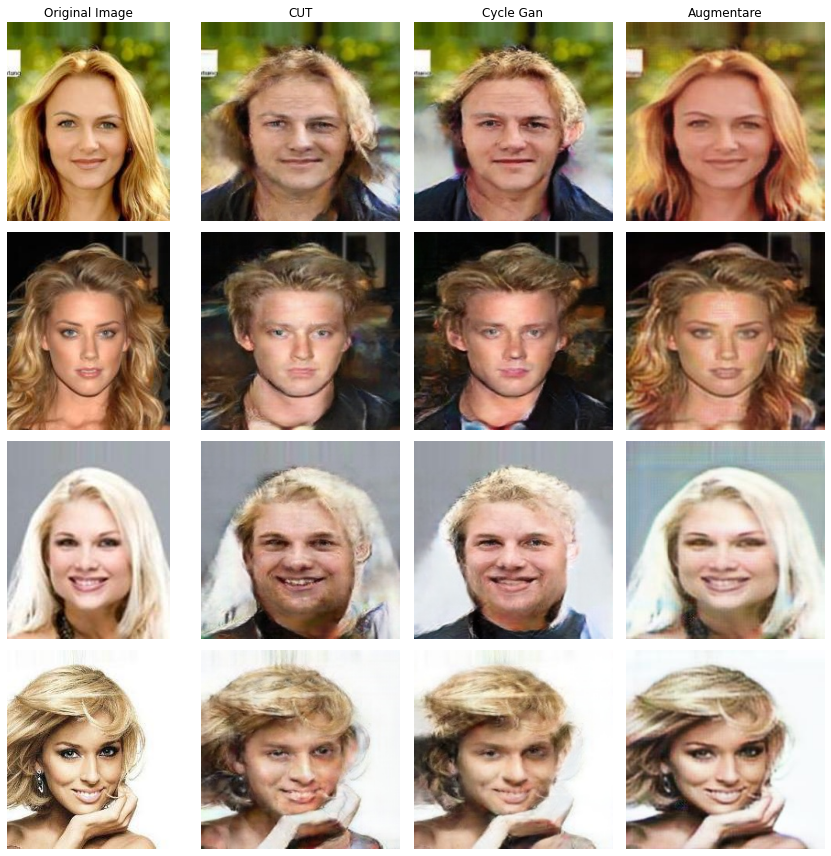

In [25]:
mode = "female_blond_2_male_blond"
plot_gan_images(source_path, mode)

# DCGAN

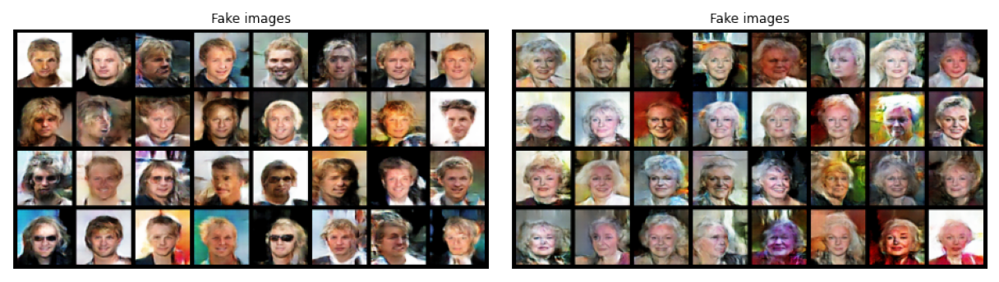

In [28]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/DCGAN/male_blond.png")
ax1.imshow(img)
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/DCGAN/female_gray.png")
ax2.imshow(img)
ax2.axis("off")

fig.tight_layout()
fig.show()

# ProGAN

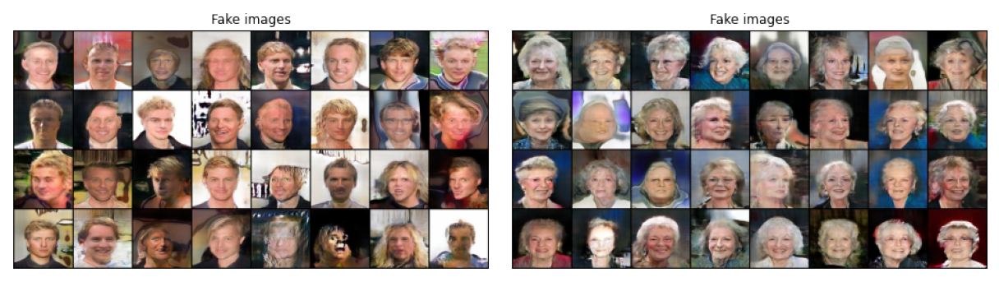

In [29]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/ProGAN/male_blond.png")
ax1.imshow(img)
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/ProGAN/female_gray.png")
ax2.imshow(img)
ax2.axis("off")

fig.tight_layout()
fig.show()

# CycleGAN

### Male Gray to Male Blond

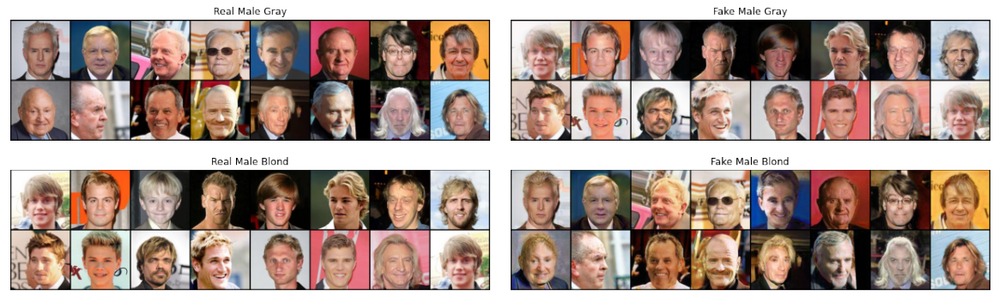

In [30]:
fig = plt.figure(figsize=(17,5))

img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/CycleGAN/male_gray_2_male_blond.png")
plt.imshow(img)
plt.axis("off")

fig.tight_layout()
fig.show()

### Female Blond to Male Blond

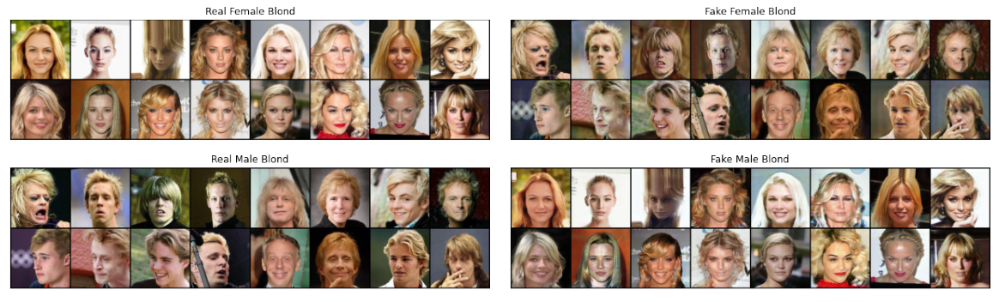

In [31]:
fig = plt.figure(figsize=(17,5))

img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/CycleGAN/female_blond_2_male_blond.png")
plt.imshow(img)
plt.axis("off")

fig.tight_layout()
fig.show()

### Female Blond to Female Gray

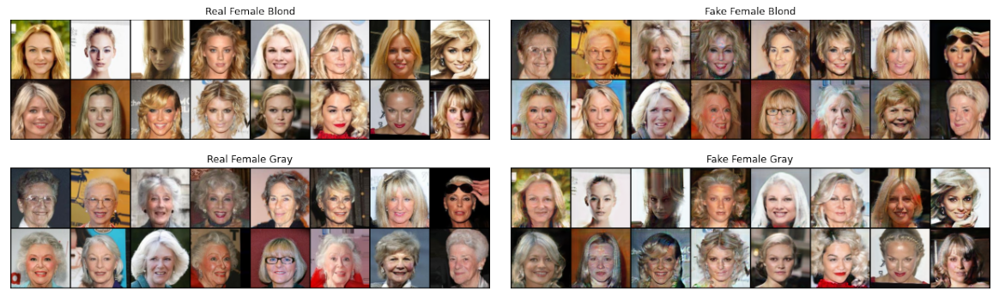

In [32]:
fig = plt.figure(figsize=(17,5))

img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/CycleGAN/female_blond_2_female_gray.png")
plt.imshow(img)
plt.axis("off")

fig.tight_layout()
fig.show()

### Male Gray to Female Gray

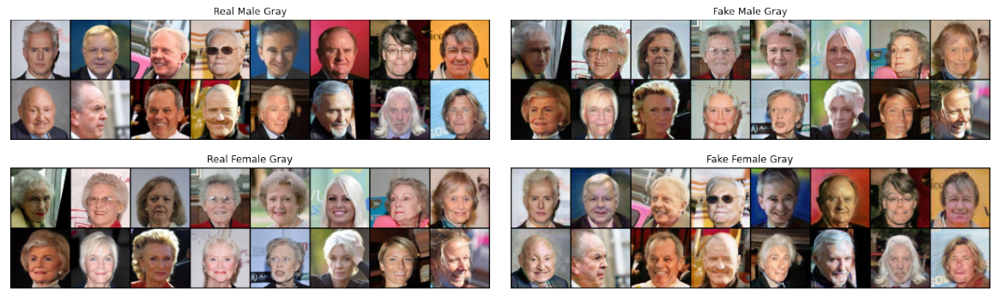

In [33]:
fig = plt.figure(figsize=(17,5))

img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_GAN/CycleGAN/male_gray_2_female_gray.png")
plt.imshow(img)
plt.axis("off")

fig.tight_layout()
fig.show()